# Training matterport Mask R-CNN to Recognize Electric Scooters



In [1]:
%load_ext autoreload

In [2]:
import os
import sys
import json
import numpy as np
import time
import imgaug
from PIL import Image, ImageDraw
from pathlib import Path

## Import matterport's mrcnn libraries

These libraries are what runs the model in the backend.  The folders contain all of the functions and methods that are run in this notebook

In [3]:
# Set the ROOT_DIR variable to the root directory of the Mask_RCNN git repo
ROOT_DIR = 'Mask_RCNN/'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist. Did you forget to read the instructions above? ;)'

# Import mrcnn libraries
sys.path.append(ROOT_DIR) 
from mrcnn.config import Config
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib

Using TensorFlow backend.


## Log Directory and Model Path

This is where the logs are stored.  
**NOTE:** The logs are where each epoch is stored.  This folder can get very big.  Previous epochs can be deleted out of this folder to save storage space.

It will also download the pre-trained COCO weights to start from if they are not present.

In [4]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Configuration


    - NAME = name of this configuration
    - NUM_CLASSES = n + 1 ~ The model always needs one class for background

    - STEPS_PER_EPOCH = This should be equal to the number of images divided by (IMAGES_PER_GPU * GPU_COUNT)

In [5]:
class ScooterConfig(Config):
    """Configuration for training on the box_synthetic dataset.
    Derives from the base Config class and overrides specific values.
    """
    # Give the configuration a recognizable name
    NAME = "scooters"

    # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + scooter

    # All of our training images are 768 x 1024
    IMAGE_MIN_DIM = 768
    IMAGE_MAX_DIM = 1024

    # 
    STEPS_PER_EPOCH = 98

    # This is how often validation is run. If you are using too much hard drive space
    # on saved models (in the MODEL_DIR), try making this value larger.
    VALIDATION_STEPS = 10
    
    # Matterport originally used resnet101, hard to run on CPU
    BACKBONE = 'resnet101'

    # To be honest, I haven't taken the time to figure out what these do
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 
    
config = ScooterConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  768
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

# Define the dataset
This is mostly generic to a COCO-like dataset, which can be outputted from most annotating software.  If the software outputs the annotations in a different format, the JSON file will need to be reviewed for the correct way to parse it.
This format is compatible with RectLabel, available only on MacOS :(

In [37]:
class CocoLikeDataset(utils.Dataset):
    """ Generates a COCO-like dataset, i.e. an image dataset annotated in the style of the COCO dataset.
        See http://cocodataset.org/#home for more information.
    """
    def load_data(self, annotation_json, images_dir):
        """ Load the coco-like dataset from json
        Args:
            annotation_json: The path to the coco annotations json file
            images_dir: The directory holding the images referred to by the json file
        """
        # Load json from file
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        
        # Add the class names using the base method from utils.Dataset
        source_name = "coco_like"
        for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
            if class_id < 1:
                print('Error: Class id for "{}" cannot be less than one. (0 is reserved for the background)'.format(class_name))
                return
            
            self.add_class(source_name, class_id, class_name)
        
        # Get all annotations
        annotations = {}
        for annotation in coco_json['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        
        # Get all images and add them to the dataset
        seen_images = {}
        for image in coco_json['images']:
            image_id = image['id']
            if image_id in seen_images:
                print("Warning: Skipping duplicate image id: {}".format(image))
            else:
                seen_images[image_id] = image
                try:
                    image_file_name = image['file_name']
                    image_width = image['width']
                    image_height = image['height']
                except KeyError as key:
                    print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
                image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
                image_annotations = annotations[image_id]
                
                # Add the image using the base method from utils.Dataset
                self.add_image(
                    source=source_name,
                    image_id=image_id,
                    path=image_path,
                    width=image_width,
                    height=image_height,
                    annotations=image_annotations
                )
                
    def load_mask(self, image_id):
        """ Load instance masks for the given image.
        MaskRCNN expects masks in the form of a bitmap [height, width, instances].
        Args:
            image_id: The id of the image to load masks for
        Returns:
            masks: A bool array of shape [height, width, instance count] with
                one mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """
        image_info = self.image_info[image_id]
        annotations = image_info['annotations']
        instance_masks = []
        class_ids = []
        
        for annotation in annotations:
            class_id = annotation['category_id']
            mask = Image.new('1', (image_info['width'], image_info['height']))
            mask_draw = ImageDraw.ImageDraw(mask, '1')
            for segmentation in annotation['segmentation']:
                mask_draw.polygon(segmentation, fill=1)
                bool_array = np.array(mask) > 0
                instance_masks.append(bool_array)
                class_ids.append(class_id)

        mask = np.dstack(instance_masks)
        class_ids = np.array(class_ids, dtype=np.int32)
        
        return mask, class_ids

# Create the Training and Validation Datasets

`load_data` loads the images and annotations from the JSON file, that should be pointed to in the training and validation folders respectively.  
`prepare` puts it in the correct format for the model.  `prepare` is a necessary step

In [38]:
dataset_train = CocoLikeDataset()
dataset_train.load_data('scooter/train/annotations.json',
                        'scooter/train/')
dataset_train.prepare()

dataset_val = CocoLikeDataset()
dataset_val.load_data('scooter/val/annotations.json',
                      'scooter/val/')
dataset_val.prepare()

## Display a few images from the train and val datasets
This will just make sure everything is set up correctly

Displaying examples from training dataset:


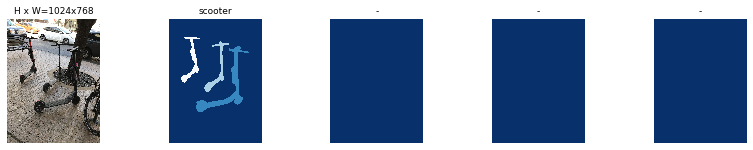

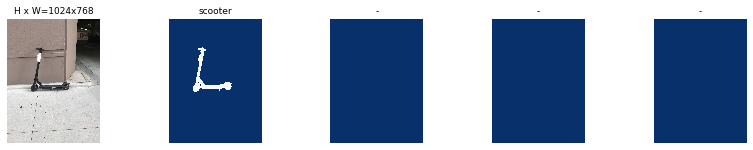

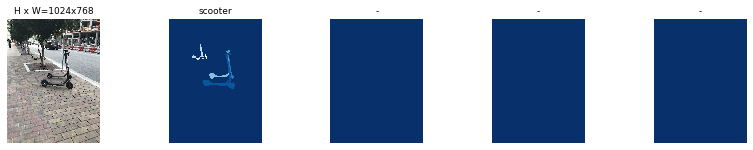

Displaying examples from validation dataset:


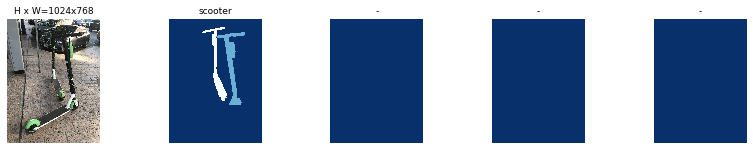

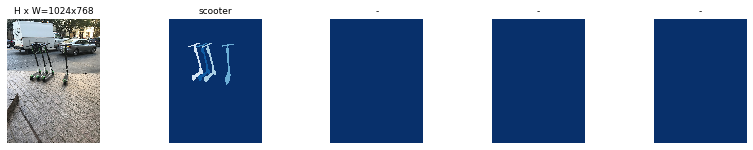

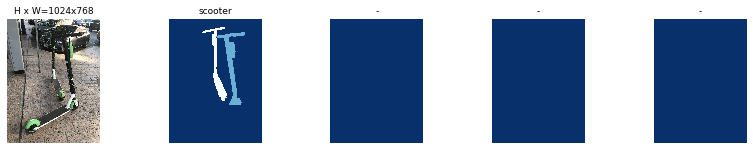

In [8]:
for name, dataset in [('training', dataset_train), ('validation', dataset_val)]:
    print(f'Displaying examples from {name} dataset:')
    
    image_ids = np.random.choice(dataset.image_ids, 3)
    for image_id in image_ids:
        image = dataset.load_image(image_id)
        mask, class_ids = dataset.load_mask(image_id)
        visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

## Create the Training Model
This code is largely borrowed from the train_shapes.ipynb notebook in the Matterport repo.

In [9]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

W0827 07:24:28.664981 140289306109760 deprecation_wrapper.py:119] From /home/datapointchris/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0827 07:24:28.687494 140289306109760 deprecation_wrapper.py:119] From /home/datapointchris/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0827 07:24:28.715101 140289306109760 deprecation_wrapper.py:119] From /home/datapointchris/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0827 07:24:28.749411 140289306109760 deprecation_wrapper.py:119] From /home/datapointchris/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:1919: The name tf.nn.fused_batch_norm is deprecated. Pleas

In [10]:
# Which weights to start with?
init_with = "last"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

Re-starting from epoch 400


## Visualize the Augmentations

In [11]:
augmentation = imgaug.augmenters.Sometimes(.75,
                                      
            imgaug.augmenters.Sequential([                  
                    imgaug.augmenters.Fliplr(0.6),
                    imgaug.augmenters.Flipud(.6),
                    imgaug.augmenters.GaussianBlur(sigma=(0.0, 3.0)),
                    imgaug.augmenters.CropAndPad(percent=(-0.25, 0.25)),
                    imgaug.augmenters.Affine(rotate=45),
                    imgaug.augmenters.Affine(rotate=135),
                    imgaug.augmenters.Affine(rotate=330),
                    imgaug.augmenters.Affine(rotate=225),
                    imgaug.augmenters.Affine(scale=1.5),
                    imgaug.augmenters.Affine(scale=.75)
                                        ]))


Displaying Augmentations for Scooters:


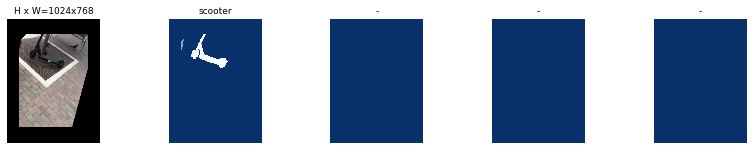

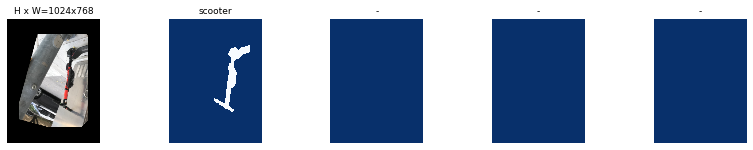

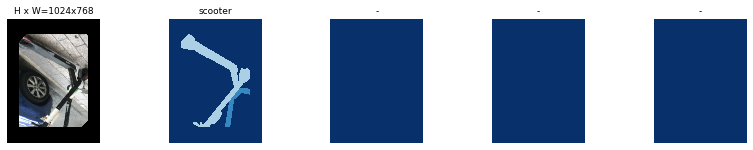

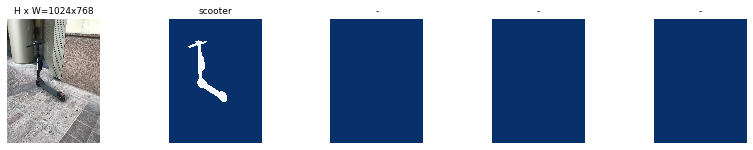

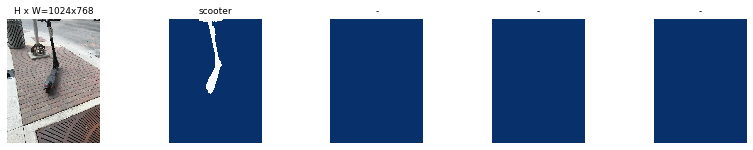

In [13]:
image_ids = np.random.choice(dataset_train.image_ids, 5)
print(f'Displaying Augmentations for Scooters:')

for image_id in image_ids:
        image = dataset_train.load_image(image_id)
        mask, class_ids = dataset_train.load_mask(image_id)
        auged = augmentation.to_deterministic()
        image_aug = auged.augment_image(image)
        mask_aug = auged.augment_image(mask)

        visualize.display_top_masks(image_aug, mask_aug, class_ids, dataset.class_names)

## Training

Either training the 'heads' or 'all'

Only the heads freezes all the backbone layers and training only the 'head' or end layers and not the entire model. To train only the head layers, pass layers='heads' to the train() function.



> Fine tune all layers  
> Passing layers="all" trains all layers. You can also  
> pass a regular expression to select which layers to  
> train by name pattern.

In [14]:
dataset_train.load_image(1).shape

(1024, 768, 3)

In [15]:
# Generator is built into the model using Keras with augmentation on!
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
start_train = time.time()






model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=500, 
            layers='all',
            augmentation=augmentation)





end_train = time.time()
minutes = round((end_train - start_train) / 60, 2)
print(f'Training took {minutes} minutes')


Starting at epoch 400. LR=0.001

Checkpoint Path: Mask_RCNN/logs/scooters20190817T2250/mask_rcnn_scooters_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Conv2D)
bn3a_branch2b   

W0827 07:25:02.053341 140289306109760 deprecation_wrapper.py:119] From /home/datapointchris/anaconda3/lib/python3.7/site-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

/home/datapointchris/anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/datapointchris/anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/datapointchris/anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a

Epoch 401/500
98/98 [==============================] - 151s 2s/step - loss: 0.4962 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.3321 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0394 - mrcnn_mask_loss: 0.0818 - val_loss: 1.3664 - val_rpn_class_loss: 0.0062 - val_rpn_bbox_loss: 1.0446 - val_mrcnn_class_loss: 0.1232 - val_mrcnn_bbox_loss: 0.0675 - val_mrcnn_mask_loss: 0.1250
Epoch 402/500
98/98 [==============================] - 78s 793ms/step - loss: 0.3896 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.0252 - mrcnn_bbox_loss: 0.0213 - mrcnn_mask_loss: 0.0803 - val_loss: 2.2945 - val_rpn_class_loss: 0.0352 - val_rpn_bbox_loss: 1.4253 - val_mrcnn_class_loss: 0.4060 - val_mrcnn_bbox_loss: 0.2457 - val_mrcnn_mask_loss: 0.1822
Epoch 403/500
98/98 [==============================] - 79s 802ms/step - loss: 0.3939 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.0315 - mrcnn_mask_loss: 0.0864 - val_loss: 1.1331 - val_rpn_

Epoch 423/500
98/98 [==============================] - 78s 799ms/step - loss: 0.5118 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.3804 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0261 - mrcnn_mask_loss: 0.0776 - val_loss: 1.0594 - val_rpn_class_loss: 0.0030 - val_rpn_bbox_loss: 0.7604 - val_mrcnn_class_loss: 0.1019 - val_mrcnn_bbox_loss: 0.0793 - val_mrcnn_mask_loss: 0.1149
Epoch 424/500
98/98 [==============================] - 79s 801ms/step - loss: 0.4675 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.3268 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0295 - mrcnn_mask_loss: 0.0803 - val_loss: 2.0357 - val_rpn_class_loss: 0.0091 - val_rpn_bbox_loss: 1.3299 - val_mrcnn_class_loss: 0.3376 - val_mrcnn_bbox_loss: 0.2040 - val_mrcnn_mask_loss: 0.1550
Epoch 425/500
98/98 [==============================] - 78s 797ms/step - loss: 0.4849 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.3211 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0366 - mrcnn_mask_loss: 0.0920 - val_loss: 1.8067 - val_rp

Epoch 445/500
98/98 [==============================] - 78s 797ms/step - loss: 0.4393 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.3097 - mrcnn_class_loss: 0.0237 - mrcnn_bbox_loss: 0.0270 - mrcnn_mask_loss: 0.0763 - val_loss: 1.5148 - val_rpn_class_loss: 0.0082 - val_rpn_bbox_loss: 0.8794 - val_mrcnn_class_loss: 0.3179 - val_mrcnn_bbox_loss: 0.1681 - val_mrcnn_mask_loss: 0.1411
Epoch 446/500
98/98 [==============================] - 78s 799ms/step - loss: 0.4668 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.3296 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0275 - mrcnn_mask_loss: 0.0809 - val_loss: 1.6908 - val_rpn_class_loss: 0.0077 - val_rpn_bbox_loss: 0.9954 - val_mrcnn_class_loss: 0.3487 - val_mrcnn_bbox_loss: 0.1823 - val_mrcnn_mask_loss: 0.1567
Epoch 447/500
98/98 [==============================] - 78s 799ms/step - loss: 0.4100 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.2579 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0335 - mrcnn_mask_loss: 0.0831 - val_loss: 1.3412 - val_rp

Epoch 467/500
98/98 [==============================] - 78s 797ms/step - loss: 0.4242 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.2954 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0224 - mrcnn_mask_loss: 0.0792 - val_loss: 1.4211 - val_rpn_class_loss: 0.0076 - val_rpn_bbox_loss: 0.9020 - val_mrcnn_class_loss: 0.2772 - val_mrcnn_bbox_loss: 0.1182 - val_mrcnn_mask_loss: 0.1161
Epoch 468/500
98/98 [==============================] - 78s 797ms/step - loss: 0.3301 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.1946 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0258 - mrcnn_mask_loss: 0.0813 - val_loss: 1.4669 - val_rpn_class_loss: 0.0072 - val_rpn_bbox_loss: 0.9371 - val_mrcnn_class_loss: 0.2487 - val_mrcnn_bbox_loss: 0.1548 - val_mrcnn_mask_loss: 0.1191
Epoch 469/500
98/98 [==============================] - 78s 800ms/step - loss: 0.3786 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0245 - mrcnn_mask_loss: 0.0788 - val_loss: 1.6318 - val_rp

Epoch 489/500
98/98 [==============================] - 79s 803ms/step - loss: 0.4943 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0353 - mrcnn_mask_loss: 0.0736 - val_loss: 1.6114 - val_rpn_class_loss: 0.0120 - val_rpn_bbox_loss: 0.8937 - val_mrcnn_class_loss: 0.3729 - val_mrcnn_bbox_loss: 0.1791 - val_mrcnn_mask_loss: 0.1538
Epoch 490/500
98/98 [==============================] - 79s 802ms/step - loss: 0.4007 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.0227 - mrcnn_mask_loss: 0.0786 - val_loss: 1.1994 - val_rpn_class_loss: 0.0055 - val_rpn_bbox_loss: 0.7912 - val_mrcnn_class_loss: 0.1959 - val_mrcnn_bbox_loss: 0.0919 - val_mrcnn_mask_loss: 0.1149
Epoch 491/500
98/98 [==============================] - 79s 801ms/step - loss: 0.4016 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.0245 - mrcnn_mask_loss: 0.0832 - val_loss: 1.8792 - val_rp

# Prepare to run Inference
Create a new InferenceConfig, then use it to create a new model.

In [16]:
class InferenceConfig(ScooterConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 768
    IMAGE_MAX_DIM = 1024
    DETECTION_MIN_CONFIDENCE = 0.80
    

inference_config = InferenceConfig()

In [17]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

W0827 10:03:59.710978 140289306109760 deprecation_wrapper.py:119] From /home/datapointchris/github/capstone/mrcnn/model.py:720: The name tf.sets.set_intersection is deprecated. Please use tf.sets.intersection instead.

W0827 10:03:59.786695 140289306109760 deprecation.py:323] From /home/datapointchris/github/capstone/mrcnn/model.py:772: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.cast` instead.


### Load Trained Weights

**Note:** `model.find_last()` will find the last model trained in the `logs` directory.  
It is also possible to train from specified model weights.

In [18]:
# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = str(Path(ROOT_DIR) / "logs" / "box_synthetic20190328T2255/mask_rcnn_box_synthetic_0016.h5" )
model_path = model.find_last()

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  Mask_RCNN/logs/scooters20190817T2250/mask_rcnn_scooters_0500.h5
Re-starting from epoch 500


# Image Inference
Run model.detect() on real images.

Adjust the "figsize" in the cell below to make the image larger or smaller.

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


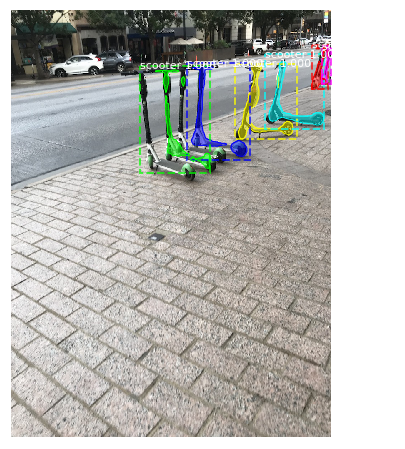

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


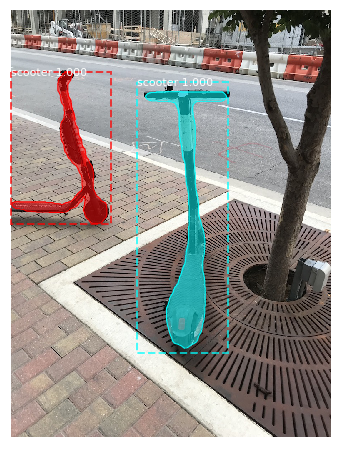

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


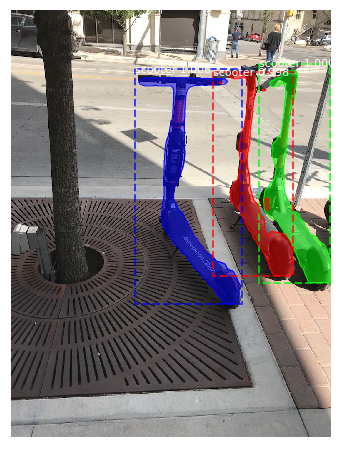

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


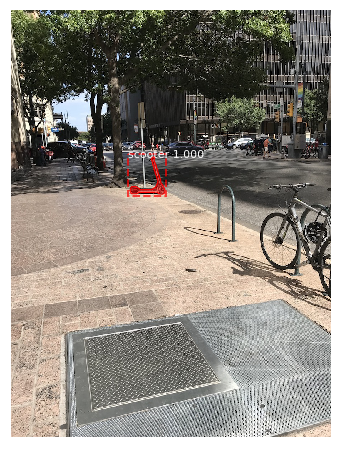

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32

*** No instances to display *** 



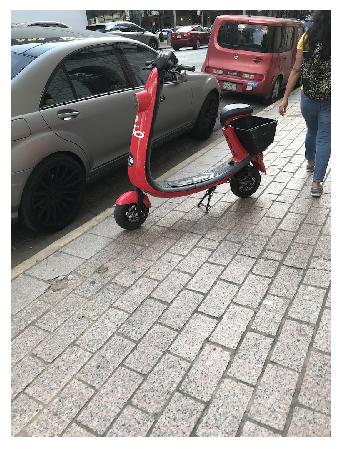

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


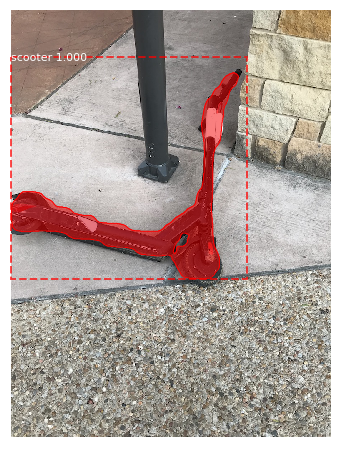

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


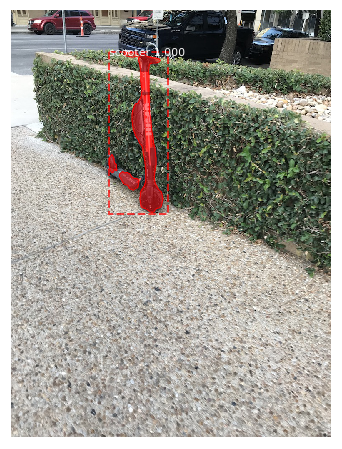

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


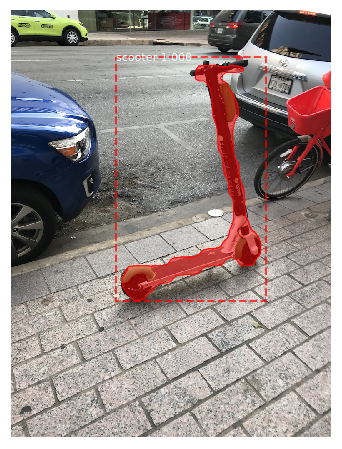

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


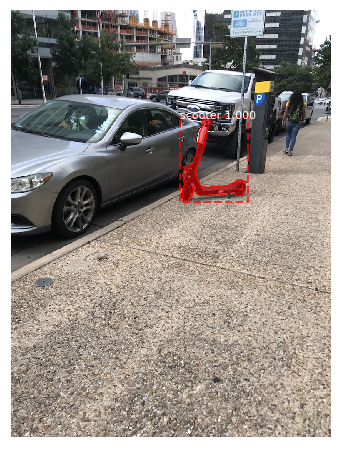

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


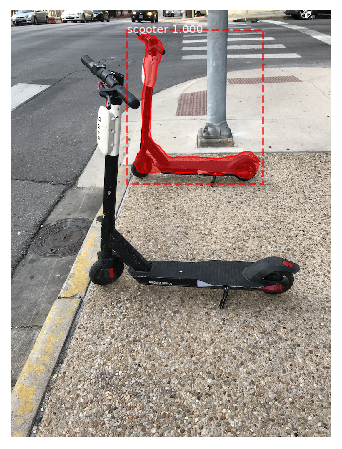

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


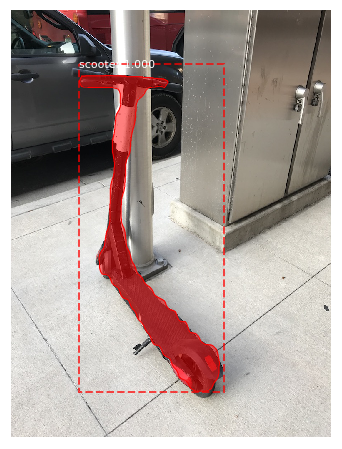

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


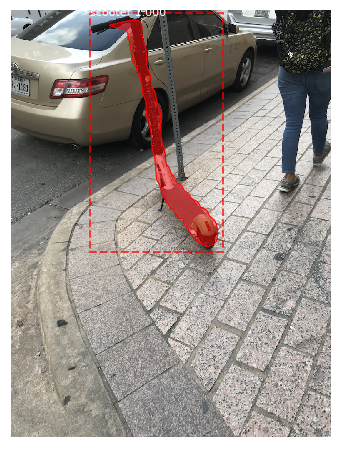

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


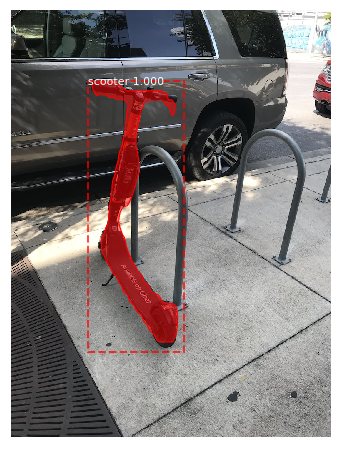

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


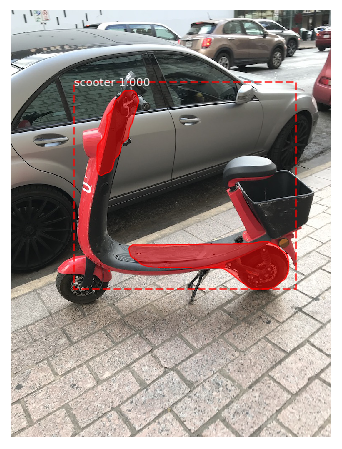

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


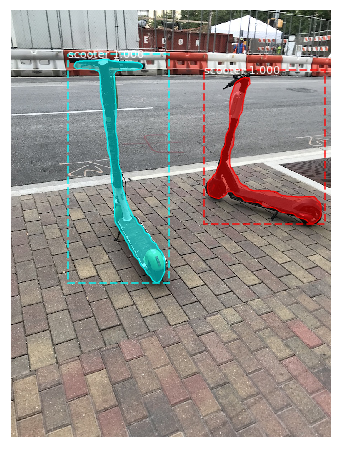

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


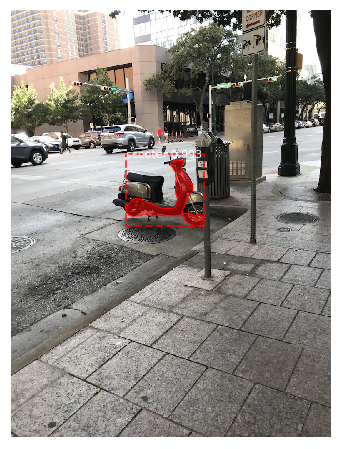

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


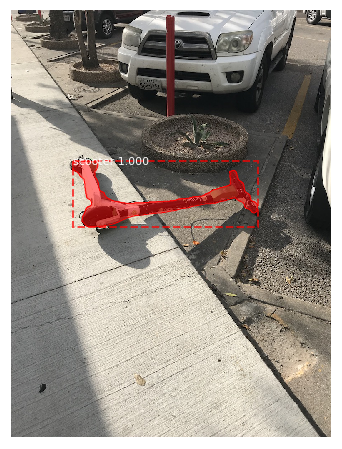

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


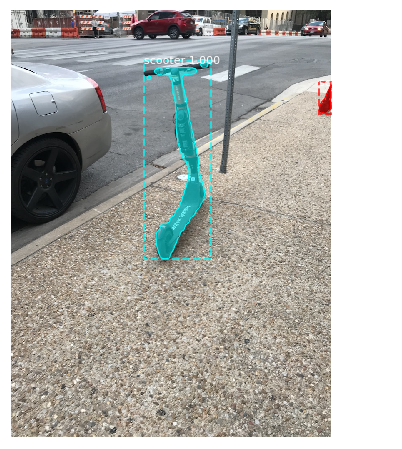

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


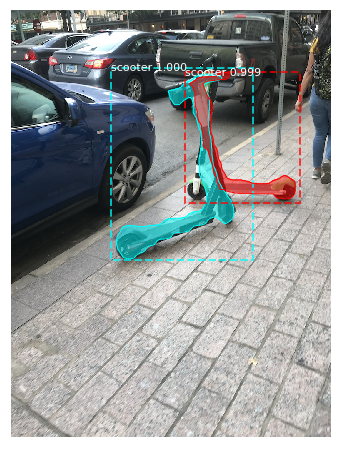

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


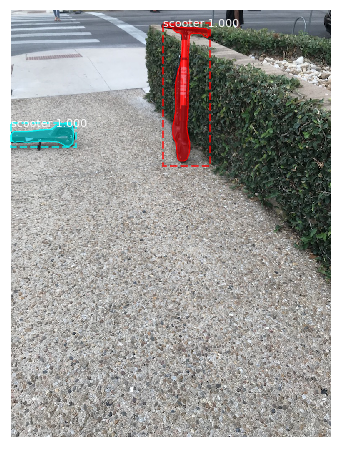

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


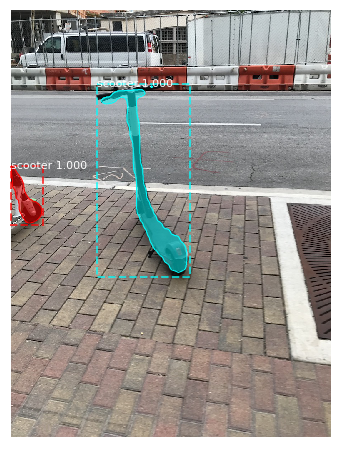

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


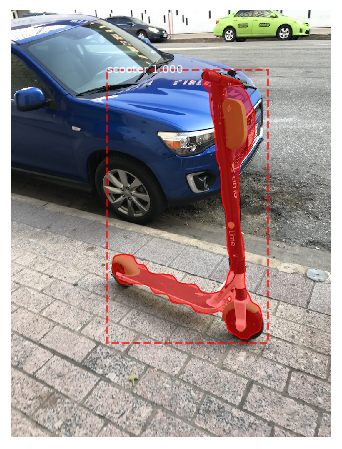

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32

*** No instances to display *** 



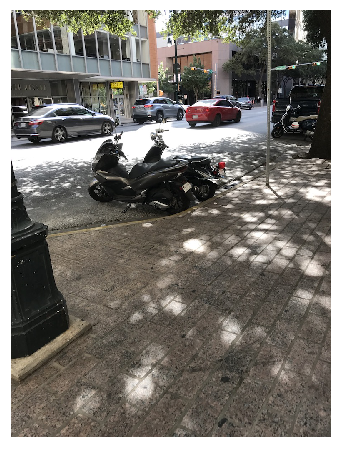

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


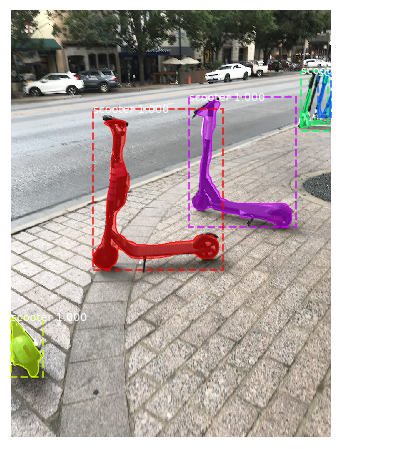

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


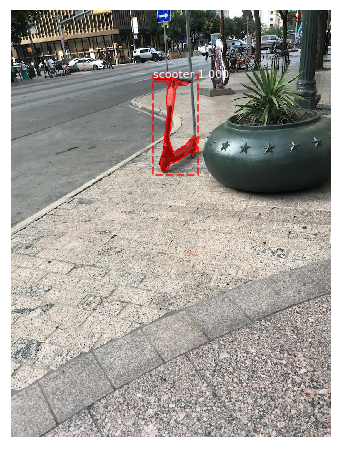

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


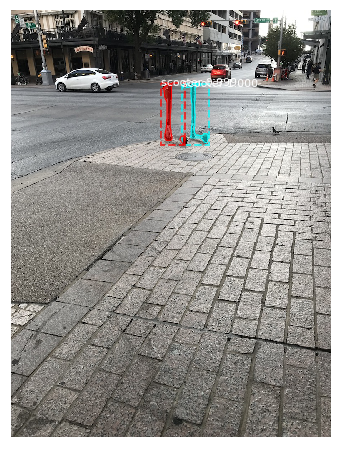

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


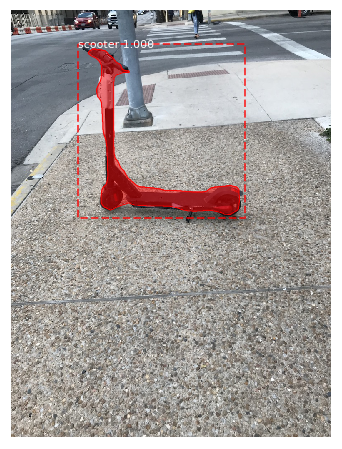

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


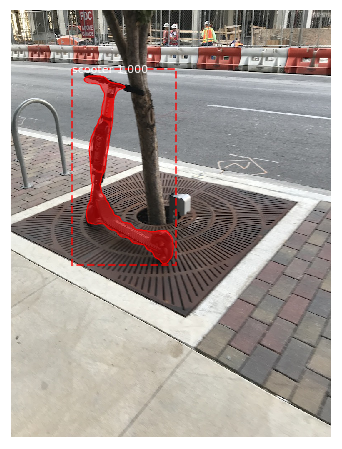

In [19]:
import skimage

real_test_dir = 'scooter/test/'
image_paths = []
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=1)
    r = results[0]
    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                dataset_train.class_names, r['scores'], figsize=(8,8))

## Results

- A few false positives from the mopeds.  I'm not sure if more or less training will fix that.  
- I am assuming that there are not enough images to create a good dataset.  
- One or two images have false negatives where the scooter(s) were visible but not detected.

# Video Inference
## Prepare to run Video Inference
Note: This code is adapted from https://www.dlology.com/blog/how-to-run-object-detection-and-segmentation-on-video-fast-for-free/ created by Chengwei Zhang.

I believe that the model can handle other formats besides MP4, but I did not try it.  
*Note:* Even on a 1080ti and a video of 17 seconds, this took 5 MINUTES to process.  My 1080ti was only able to handle 1 image (frame) at a time, but possibly it could have handled 2.  Some cards may not even be able to handle one frame, therefore the video resolution will have to be scaled down.

In [30]:
video_file = Path("scoot.mp4")
video_save_dir = Path("scooter/")
video_save_dir.mkdir(exist_ok=True)

### Adjust Config Parameters
Depending on the resolution of your video, you may want to update the parameters below.  

**This is Important!**  

Mask R-CNN requires IMAGE_MIN_DIM to be divisible by 2, six times, so that's why I'm using 1088 instead of 1080, which is the actual height of the video.

In [27]:
class VideoInferenceConfig(ScooterConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 1088
    IMAGE_MAX_DIM = 1920
    IMAGE_SHAPE = [1920, 1080, 3]
    DETECTION_MIN_CONFIDENCE = 0.80
    

inference_config = VideoInferenceConfig()

### Set Up Model and Load Trained Weights

In [18]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

In [19]:
# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = str(Path(ROOT_DIR) / "logs" / "box_synthetic20190328T2255/mask_rcnn_box_synthetic_0016.h5" )
model_path = model.find_last()

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  Mask_RCNN/logs/scooters20190817T2250/mask_rcnn_scooters_0500.h5
Re-starting from epoch 500


In [20]:
import cv2
import skimage
import random
import colorsys
from tqdm import tqdm

In [21]:
def random_colors(N, bright=True):
    """ Generate random colors. 
        To get visually distinct colors, generate them in HSV space then
        convert to RGB.
    Args:
        N: the number of colors to generate
        bright: whether or not to use bright colors
    Returns:
        a list of RGB colors, e.g [(0.0, 1.0, 0.0), (1.0, 0.0, 0.5), ...]
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

def apply_mask(image, mask, color, alpha=0.5):
    """ Apply the given mask to the image.
    Args:
        image: a cv2 image
        mask: a mask of which pixels to color
        color: the color to use
        alpha: how visible the mask should be (0 to 1)
    Returns:
        a cv2 image with mask applied
    """
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image

def display_instances(image, boxes, masks, ids, names, scores, colors):
    """ Take the image and results and apply the mask, box, and label
    Args:
        image: a cv2 image
        boxes: a list of bounding boxes to display
        masks: a list of masks to display
        ids: a list of class ids
        names: a list of class names corresponding to the ids
        scores: a list of scores of each instance detected
        colors: a list of colors to use
    Returns:
        a cv2 image with instances displayed   
    """
    n_instances = boxes.shape[0]

    if not n_instances:
        return image # no instances
    else:
        assert boxes.shape[0] == masks.shape[-1] == ids.shape[0]

    for i, color in enumerate(colors):
        # Check if any boxes to show
        if not np.any(boxes[i]):
            continue
        
        # Check if any scores to show
        if scores is not None:
            score = scores[i] 
        else:
            score = None

        # Add the mask
        image = apply_mask(image, masks[:, :, i], color)
        
        # Add the bounding box
        y1, x1, y2, x2 = boxes[i]
        image = cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        
        # Add the label
        label = names[ids[i]]
        if score:
            label = f'{label} {score:.2f}'
            
        label_pos = (x1 + (x2 - x1) // 2, y1 + (y2 - y1) // 2) # center of bounding box
        image = cv2.putText(image, label, label_pos, cv2.FONT_HERSHEY_DUPLEX, 0.7, color, 2)

    return image

### Prepare for Inference
Adjust the paths below to point to the video  

**NOTE:** Path for video_file was not working correctly...  
On my to-do list to find out about Path and why it wasn't working properly

In [31]:
video_file = Path("scooter.mp4")
video_save_dir = Path("scooter/")
video_save_dir.mkdir(exist_ok=True)
vid_name = video_save_dir / "scooter_boxes.mp4"
v_format="FMP4"
fourcc = cv2.VideoWriter_fourcc(*v_format)

print('Writing output video to: ' + str(vid_name))

Writing output video to: scooter/scooter_boxes.mp4


In [34]:
video_file

PosixPath('scooter.mp4')

Random colors have been aggregated to just one for video.  They can be changed back below

Note: cv2 uses BGR (Blue Green Red) color representation instead of RGB (Red Green Blue), so we have to do a couple conversions here

In [23]:
#colors = random_colors(30)
colors = [(1.0, 1.0, 0.0)] * 30

# Change color representation from RGB to BGR before displaying instances
colors = [(color[2], color[1], color[0]) for color in colors]

### Perform Inference on Video
Use the cv2 module to open the video and perform inference on each frame.

In [39]:
input_video = cv2.VideoCapture('scoot.mp4')
frame_count = int(input_video.get(cv2.CAP_PROP_FRAME_COUNT))
fps = int(input_video.get(cv2.CAP_PROP_FPS))
output_video = None
vid_size = None
current_frame = 0

for i in tqdm(range(frame_count)):
    # Read the current frame
    ret, frame = input_video.read()
    if not ret:
        break
        
    current_frame += 1
    
    # Change color representation from BGR to RGB before running model.detect()
    detect_frame = frame[:, :, ::-1]        
    
    # Run inference on the color-adjusted frame
    results = model.detect([detect_frame], verbose=0)
    r = results[0]
    n_instances = r['rois'].shape[0]
    
    # Make sure we have enough colors
    if len(colors) < n_instances:
        # not enough colors, generate more
        more_colors = random_colors(n_instances - len(colors))
        
        # Change color representation from RGB to BGR before displaying instances
        more_colors = [(color[2], color[1], color[0]) for color in more_colors]
        colors += more_colors
        
    
    
    # Display instances on the original frame
    display_frame = display_instances(frame, r['rois'], r['masks'], r['class_ids'], 
                                dataset_train.class_names, r['scores'], colors[0:n_instances])

    # Make sure we got displayed instances
    if display_frame is not None:
        frame = display_frame

    # Create the output_video if it doesn't yet exist
    if output_video is None:
        if vid_size is None:
            vid_size = frame.shape[1], frame.shape[0]
        output_video = cv2.VideoWriter(str(vid_name), fourcc, float(fps), vid_size, True)
        
    # Resize frame if necessary
    if vid_size[0] != frame.shape[1] and vid_size[1] != frame.shape[0]:
        frame = cv2.resize(frame, vid_size)
    
    # Write the frame to the output_video
    output_video.write(frame)
    
input_video.release()
output_video.release()

100%|██████████| 518/518 [05:12<00:00,  1.73it/s]


#### Output should be in the path specified